In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use("seaborn")
import warnings
warnings.filterwarnings("ignore")
import statsmodels.formula.api as smf

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode , iplot , plot
init_notebook_mode(connected = True)
import cufflinks as cf
cf.go_offline()

import sklearn as sk
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error , r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from scipy import stats
import scipy
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier


In [2]:
healthdata = pd.read_csv("analytic_data2019.csv")
healthdata.head()

,State FIPS Code,County FIPS Code,5-digit FIPS Code,State Abbreviation,Name,Release Year,County Ranked (Yes=1/No=0),Premature death raw value,Premature death numerator,Premature death denominator,...,Male population 18-44 raw value,Male population 45-64 raw value,Male population 65+ raw value,Total male population raw value,Female population 0-17 raw value,Female population 18-44 raw value,Female population 45-64 raw value,Female population 65+ raw value,Total female population raw value,Population growth raw value
0,statecode,countycode,fipscode,state,county,year,county_ranked,v001_rawvalue,v001_numerator,v001_denominator,...,v013_rawvalue,v016_rawvalue,v017_rawvalue,v025_rawvalue,v026_rawvalue,v027_rawvalue,v031_rawvalue,v032_rawvalue,v035_rawvalue,v097_rawvalue
1,00,000,00000,US,United States,2019,NaN,6900.630354,3745538,908266078,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01,000,01000,AL,Alabama,2019,NaN,9917.2328984,80440,13636816,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01,001,01001,AL,Autauga County,2019,1,8824.0571232,815,156132,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01,003,01003,AL,Baldwin County,2019,1,7224.6321603,2827,576496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
healthdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3195 entries, 0 to 3194
Columns: 534 entries, State FIPS Code to Population growth raw value
dtypes: object(534)
memory usage: 13.0+ MB


In [4]:
healthdata.describe()

,State FIPS Code,County FIPS Code,5-digit FIPS Code,State Abbreviation,Name,Release Year,County Ranked (Yes=1/No=0),Premature death raw value,Premature death numerator,Premature death denominator,...,Male population 18-44 raw value,Male population 45-64 raw value,Male population 65+ raw value,Total male population raw value,Female population 0-17 raw value,Female population 18-44 raw value,Female population 45-64 raw value,Female population 65+ raw value,Total female population raw value,Population growth raw value
count,3195,3195,3195,3195,3195,3195,3143.0,3134,3134.0,3134.0,...,74.0,74.0,74.0,74.0,74.0,74.0,74.0,74.0,74.0,74.000000
unique,54,488,3195,53,1929,3,5.0,3133,1941.0,3126.0,...,74.0,74.0,73.0,74.0,73.0,74.0,74.0,74.0,74.0,74.000000
top,48,0,17191,TX,Washington County,2019,1.0,8132.3743216,26.0,22067.0,...,509.0,6654.0,1851.0,35306.0,4690.0,2543.0,12279.0,1022.0,21917.0,0.003391
freq,255,33,1,255,30,2171,2091.0,2,9.0,2.0,...,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.000000


In [5]:
healthdata.shape

(3195, 534)

In [6]:
healthdata.isnull().sum()

State FIPS Code                         0
County FIPS Code                        0
5-digit FIPS Code                       0
State Abbreviation                      0
Name                                    0
                                     ... 
Female population 18-44 raw value    3121
Female population 45-64 raw value    3121
Female population 65+ raw value      3121
Total female population raw value    3121
Population growth raw value          3121
Length: 534, dtype: int64

In [7]:
xls = pd.ExcelFile("2019 County Health Rankings Data - v2.xls")
y = pd.read_excel(xls, "Outcomes & Factors Rankings")
df2 = pd.read_excel(xls, "Outcomes & Factors SubRankings")
df3 = pd.read_excel(xls, "Ranked Measure Data")
life_exp = pd.read_excel(xls, "Additional Measure Data")

In [8]:
life_exp = pd.read_excel(xls, "Additional Measure Data" , skiprows = 1)
life_exp

,FIPS,State,County,Life Expectancy,95% CI - Low,95% CI - High,Life Expectancy (Black),Life Expectancy (Hispanic),Life Expectancy (White),# Deaths,...,% Hispanic,# Non-Hispanic White,% Non-Hispanic White,# Not Proficient in English,% Not Proficient in English,95% CI - Low.16,95% CI - High.16,% Female,# Rural,% Rural
0,1001,Alabama,Autauga,76.330589,75.554117,77.107061,74.600628,NaN,76.337219,815.0,...,2.857452,41336,74.473912,430,0.828548,0.422472,1.234624,51.342246,22921.0,42.002162
1,1003,Alabama,Baldwin,78.599498,78.208357,78.990639,75.628919,98.039893,78.537003,2827.0,...,4.550200,176582,83.047388,872,0.454512,0.282144,0.626880,51.452772,77060.0,42.279099
2,1005,Alabama,Barbour,75.779457,74.639355,76.919559,74.240228,NaN,77.568384,451.0,...,4.206569,11613,45.955679,297,1.199273,0.580536,1.818011,47.229917,18613.0,67.789635
3,1007,Alabama,Bibb,73.928271,72.624611,75.231931,72.294686,NaN,74.109510,445.0,...,2.638080,16842,74.298571,84,0.394348,0.000000,0.933361,46.453150,15663.0,68.352607
4,1009,Alabama,Blount,74.597767,73.810999,75.384535,NaN,78.577094,74.098247,1050.0,...,9.565097,50439,86.944306,1013,1.870004,1.364180,2.375829,50.688639,51562.0,89.951502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,Sweetwater,77.840131,76.943454,78.736807,NaN,79.057364,77.366510,495.0,...,16.249368,34548,79.358662,654,1.582845,0.977804,2.187887,48.454082,4782.0,10.916313
3138,56039,Wyoming,Teton,87.438200,85.487562,89.388837,NaN,82.452056,86.664388,124.0,...,14.983881,19008,81.702128,877,4.042033,2.376556,5.707511,48.098001,9887.0,46.430920
3139,56041,Wyoming,Uinta,78.397790,76.905128,79.890452,NaN,77.587425,77.873113,262.0,...,9.163211,17928,87.474994,175,0.911363,0.035462,1.787265,49.573067,9101.0,43.095937
3140,56043,Wyoming,Washakie,80.465989,78.577420,82.354558,NaN,NaN,NaN,108.0,...,14.248512,6647,82.428075,27,0.346198,0.000000,1.381348,49.466766,3068.0,35.954529


# Interactive Visualization of Life Expectancy By States

In [9]:
life_exp.iplot(kind = "bar" , x = "State" , y = "Life Expectancy" , xTitle = "County Name" ,
         yTitle = "Life Expectency" , title = "Life Expectancy Of States")

# Interactive Plot of Each State In The United States

In [ ]:
#import plotly.figure_factory as ff

In [10]:
fips = life_exp['FIPS']
values = life_exp['Life Expectancy']

#fig = ff.create_choropleth(fips=fips, values=values)
#fig.layout.template = None
#fig.show()

In [11]:
state_codes = {
    'District of Columbia' : 'dc','Mississippi': 'MS', 'Oklahoma': 'OK', 
    'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 
    'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 
    'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 
    'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 
    'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 
    'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 
    'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI',
    'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 
    'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 
    'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 
    'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 
    'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 
    'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 
    'Nevada': 'NV', 'Maine': 'ME'}

life_exp['state_code'] = life_exp['State'].apply(lambda x : state_codes[x])

In [12]:
# The data dict
data = dict(type='choropleth',
            locations = life_exp['state_code'], # passing column with state codes
            locationmode = 'USA-states',
            z = life_exp['FIPS'], # What the color nar will represent
            text = life_exp['Life Expectancy'], # Newly generated column to hover 
            marker = dict(line = dict(color = 'rgb(255,255,255)',width = 2)),
            colorbar = {'title':"Years"}
            ) 

# And our layout dictionary with some more arguments:
layout = dict(title = '2019 US Life Expectancy by State',
              geo = dict(scope='usa',
                         showlakes = True, # we want actual lake on the map
                         lakecolor = 'rgb(85,173,240)') # blue for lakes
             )

# Passing data and layout to the go.Figure 
choropleth_map = go.Figure(data = [data],layout = layout)
# Passing map to iplot for plotting 
iplot(choropleth_map , validate = False)

# import cleaned data

In [13]:
df = pd.read_csv("Cleaned_health_data.csv")
df.head()

,Unnamed: 0,Zip,State_Abb,State,Year,Ranked,Premature_death_raw_value,Poor_or_fair_health_raw_value,Poor_physical_health_days_raw_value,Poor_mental_health_days_raw_value,...,%_65_and_older_raw_value,%_Non-Hispanic_African_American_raw_value,%_American_Indian_and_Alaskan_Native_raw_value,%_Asian_raw_value,%_Native_Hawaiian/Other_Pacific_Islander_raw_value,%_Hispanic_raw_value,%_Non-Hispanic_white_raw_value,%_not_proficient_in_English_raw_value,%_Females_raw_value,%_Rural_raw_value
0,3,1001,AL,Autauga County,2019,1.0,8824.057123,0.184111,4.200578,4.306739,...,0.151196,0.192545,0.004756,0.012792,0.001045,0.028575,0.744739,0.008285,0.513422,0.420022
1,4,1003,AL,Baldwin County,2019,1.0,7224.632160,0.180605,4.098748,4.249649,...,0.199470,0.089532,0.007760,0.011565,0.000687,0.045502,0.830474,0.004545,0.514528,0.422791
2,5,1005,AL,Barbour County,2019,1.0,9586.165037,0.257734,5.067438,4.634994,...,0.188247,0.479422,0.006529,0.004630,0.001860,0.042066,0.459557,0.011993,0.472299,0.677896
3,6,1007,AL,Bibb County,2019,1.0,11783.543675,0.199969,4.363377,4.315710,...,0.160226,0.214576,0.004279,0.002206,0.001147,0.026381,0.742986,0.003943,0.464531,0.683526
4,7,1009,AL,Blount County,2019,1.0,10908.101822,0.210953,4.512753,4.701599,...,0.178426,0.014600,0.006326,0.003017,0.001172,0.095651,0.869443,0.018700,0.506886,0.899515


In [ ]:
# The data dict
data = dict(type='choropleth',
            colorscale = 'ylorbr', # random selection - Yellow-Orange-Red
            locations = life_exp['State'], # passing column with state codes
            locationmode = 'USA-states',
            z = life_exp['Life Expectancy'], # What the color nar will represent
            text = life_exp['Life Expectancy'], # Newly generated column to hover 
            marker = dict(line = dict(color = 'rgb(255,255,255)',width = 2)),
            colorbar = {'title':"Millions"}
            ) 

# And our layout dictionary with some more arguments:
layout = dict(title = '2019 US Life Expectancy by State',
              geo = dict(scope='usa',
                         showlakes = True, # we want actual lake on the map
                         lakecolor = 'rgb(85,173,240)') # blue for lakes
             )

# Passing data and layout to the go.Figure 
choromap = go.Figure(data = [data],layout = layout)
# Passing map to iplot for plotting 
iplot(choromap)

In [14]:
df.dtypes

Unnamed: 0                                 int64
Zip                                        int64
State_Abb                                 object
State                                     object
Year                                       int64
                                          ...   
%_Hispanic_raw_value                     float64
%_Non-Hispanic_white_raw_value           float64
%_not_proficient_in_English_raw_value    float64
%_Females_raw_value                      float64
%_Rural_raw_value                        float64
Length: 82, dtype: object

In [15]:
df.isnull().sum()

Unnamed: 0                               0
Zip                                      0
State_Abb                                0
State                                    0
Year                                     0
                                        ..
%_Hispanic_raw_value                     0
%_Non-Hispanic_white_raw_value           0
%_not_proficient_in_English_raw_value    0
%_Females_raw_value                      0
%_Rural_raw_value                        7
Length: 82, dtype: int64

In [16]:
df.dropna(inplace = True)

In [17]:
for x in df.columns[4:]:
    df[x] = df[x].astype('float64')

In [18]:
from sklearn.preprocessing import LabelEncoder

In [19]:
def encode_features(data_set, feature_names):
    for feature_name in feature_names:
        le = LabelEncoder()
        le.fit(data_set[feature_name])
        encoded_column = le.transform(data_set[feature_name])
        data_set[feature_name] = encoded_column
    return data_set

In [20]:
features_to_encode = ['State','State_Abb','Life_expectancy_raw_value']
encode_data = encode_features(df, features_to_encode)
encode_data.head(10)

,Unnamed: 0,Zip,State_Abb,State,Year,Ranked,Premature_death_raw_value,Poor_or_fair_health_raw_value,Poor_physical_health_days_raw_value,Poor_mental_health_days_raw_value,...,%_65_and_older_raw_value,%_Non-Hispanic_African_American_raw_value,%_American_Indian_and_Alaskan_Native_raw_value,%_Asian_raw_value,%_Native_Hawaiian/Other_Pacific_Islander_raw_value,%_Hispanic_raw_value,%_Non-Hispanic_white_raw_value,%_not_proficient_in_English_raw_value,%_Females_raw_value,%_Rural_raw_value
0,3,1001,0,36,2019.0,1.0,8824.057123,0.184111,4.200578,4.306739,...,0.151196,0.192545,0.004756,0.012792,0.001045,0.028575,0.744739,0.008285,0.513422,0.420022
1,4,1003,0,39,2019.0,1.0,7224.632160,0.180605,4.098748,4.249649,...,0.199470,0.089532,0.007760,0.011565,0.000687,0.045502,0.830474,0.004545,0.514528,0.422791
3,6,1007,0,69,2019.0,1.0,11783.543675,0.199969,4.363377,4.315710,...,0.160226,0.214576,0.004279,0.002206,0.001147,0.026381,0.742986,0.003943,0.464531,0.683526
4,7,1009,0,73,2019.0,1.0,10908.101822,0.210953,4.512753,4.701599,...,0.178426,0.014600,0.006326,0.003017,0.001172,0.095651,0.869443,0.018700,0.506886,0.899515
7,10,1015,0,113,2019.0,1.0,12217.759984,0.195847,4.290448,4.476572,...,0.173123,0.207900,0.005291,0.009910,0.001124,0.037497,0.723110,0.008810,0.519307,0.336968
10,13,1021,0,158,2019.0,1.0,10831.917358,0.214653,4.736277,4.625572,...,0.163592,0.100801,0.005469,0.004992,0.001725,0.077859,0.801847,0.022533,0.508271,0.867447
15,18,1031,0,180,2019.0,1.0,7933.129666,0.202269,4.548244,4.606067,...,0.165651,0.173401,0.014130,0.015846,0.004164,0.071018,0.702471,0.012588,0.507075,0.471951
16,19,1033,0,181,2019.0,1.0,10332.484038,0.202499,4.337048,4.491632,...,0.196000,0.160789,0.006459,0.005817,0.000569,0.025505,0.784752,0.003953,0.520202,0.438947
21,24,1043,0,208,2019.0,1.0,10007.614724,0.207042,4.496509,4.750577,...,0.182889,0.011939,0.006102,0.005885,0.000955,0.043333,0.921129,0.008193,0.505661,0.732396
22,25,1045,0,216,2019.0,1.0,9637.456481,0.226133,4.716841,4.441555,...,0.163430,0.203653,0.008654,0.013611,0.002072,0.065128,0.686182,0.009535,0.506968,0.508885


# Finding Categorical Columns

In [21]:
cat_cols = list(set(df.columns) - set(df._get_numeric_data().columns))
cat_cols

[]

# numercial columns

In [22]:
num_cols = list(df._get_numeric_data().columns)
num_cols

['Unnamed: 0',
 'Zip',
 'State_Abb',
 'State',
 'Year',
 'Ranked',
 'Premature_death_raw_value',
 'Poor_or_fair_health_raw_value',
 'Poor_physical_health_days_raw_value',
 'Poor_mental_health_days_raw_value',
 'Low_birthweight_raw_value',
 'Adult_smoking_raw_value',
 'Adult_obesity_raw_value',
 'Food_environment_index_raw_value',
 'Physical_inactivity_raw_value',
 'Access_to_exercise_opportunities_raw_value',
 'Excessive_drinking_raw_value',
 'Alcohol-impaired_driving_deaths_raw_value',
 'Sexually_transmitted_infections_raw_value',
 'Teen_births_raw_value',
 'Uninsured_raw_value',
 'Primary_care_physicians_raw_value',
 'Ratio_of_population_to_primary_care_physicians.',
 'Dentists_raw_value',
 'Ratio_of_population_to_dentists.',
 'Mental_health_providers_raw_value',
 'Ratio_of_population_to_mental_health_providers.',
 'Preventable_hospital_stays_raw_value',
 'Mammography_screening_raw_value',
 'Flu_vaccinations_raw_value',
 'High_school_graduation_raw_value',
 'Some_college_raw_value',


# Heatmap to show life Expectancy

In [23]:
target = "Life_expectancy_raw_value"

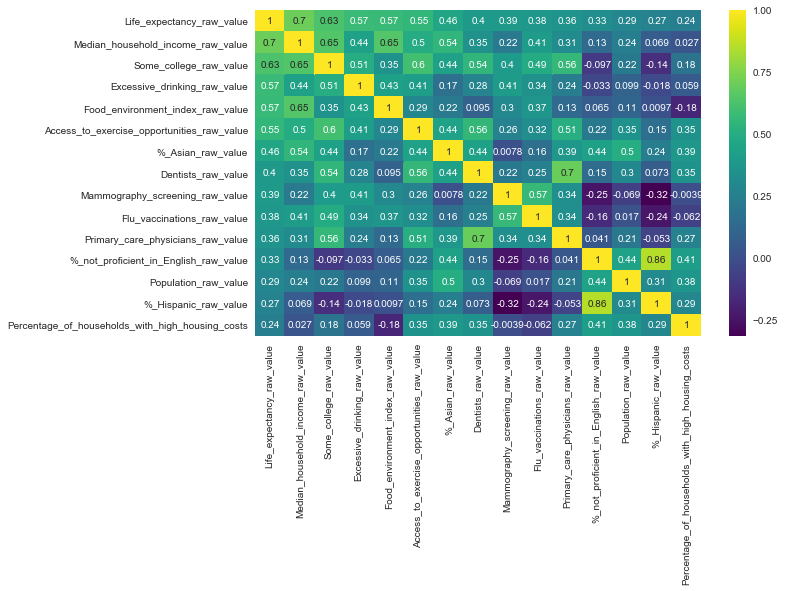

In [24]:
k = 15
cols = df[num_cols].corr().nlargest(k , target)[target].index
cm = df[cols].corr()
plt.figure(figsize = (10 , 6))
sns.heatmap(cm , annot = True , cmap = "viridis")

In [25]:
X = df.loc[:, df.columns != target]
Y = df.loc[:, df.columns == target]

In [26]:
X.shape

(1245, 81)

In [27]:
Y.shape

(1245, 1)

In [ ]:
#Note : we have some outliers and we need to deal with them later - To Do List

In [28]:
to_drop = ['State_Abb', 'State', 'Life_expectancy_raw_value']
X = df.drop(to_drop, axis = 1)
y = df['Life_expectancy_raw_value']

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 1)

# 1. Linear Regression 

In [30]:
clf = LinearRegression()
clf.fit(X_train,y_train)
y_pred_lin_reg = clf.predict(X_test)

# Accuracy of Linear Regression for Life Expectancy

In [31]:
acc_lin_reg = round( clf.score(X_train, y_train) * 100, 2)
print ('Accuracy of linear regression on life expectancy: ', str(acc_lin_reg) + ' %')

Accuracy of linear regression on life expectancy:  94.92 %


# Cross Validation Linear

In [32]:
from sklearn.model_selection import cross_val_score

In [33]:
features = X_train.columns

In [34]:
cvLin = cross_val_score(clf , df[features], df['Life_expectancy_raw_value'] , cv = 5)

In [35]:
#cross validation score
cvLin

array([0.94066568, 0.91692712, 0.94010788, 0.9252851 , 0.90939961])

In [36]:
#mean score for cross validation
cvLin = round(cvLin.mean(), 2)
cvLin

0.93

In [37]:
# pearson corr
pred = clf.predict(X_test)
truth = y_test.to_list()

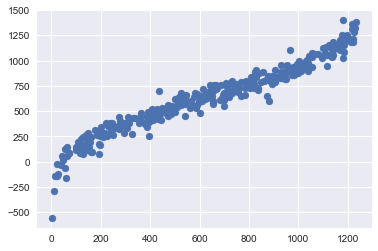

In [38]:
plt.scatter(truth, pred)

# Polynomial Features And Interactions

In [39]:
from itertools import combinations
from sklearn.preprocessing import PolynomialFeatures

In [40]:
def add_interactions(df):
    combos = list(combinations(list(df.columns) , 2))
    colnames = list(df.columns) + ["_".join(x) for x in combos]
 #find interactions
    poly = PolynomialFeatures(interaction_only=True , include_bias = False)
    df = poly.fit_transform(df)
    df = pd.DataFrame(df)
    df.columns = colnames
    #remove interaction terms with all 0 values
    noint_indicies = [i for i , x in enumerate(list((df==0).all())) if x]
    df = df.drop(df.columns[noint_indicies] , axis = 1)
    return df
    

In [41]:
X = add_interactions(X)
X.head()

,Unnamed: 0,Zip,Year,Ranked,Premature_death_raw_value,Poor_or_fair_health_raw_value,Poor_physical_health_days_raw_value,Poor_mental_health_days_raw_value,Low_birthweight_raw_value,Adult_smoking_raw_value,...,%_Hispanic_raw_value_%_Non-Hispanic_white_raw_value,%_Hispanic_raw_value_%_not_proficient_in_English_raw_value,%_Hispanic_raw_value_%_Females_raw_value,%_Hispanic_raw_value_%_Rural_raw_value,%_Non-Hispanic_white_raw_value_%_not_proficient_in_English_raw_value,%_Non-Hispanic_white_raw_value_%_Females_raw_value,%_Non-Hispanic_white_raw_value_%_Rural_raw_value,%_not_proficient_in_English_raw_value_%_Females_raw_value,%_not_proficient_in_English_raw_value_%_Rural_raw_value,%_Females_raw_value_%_Rural_raw_value
0,3.0,1001.0,2019.0,1.0,8824.057123,0.184111,4.200578,4.306739,0.084757,0.191247,...,0.021281,0.000237,0.014671,0.012002,0.006171,0.382366,0.312807,0.004254,0.003480,0.215649
1,4.0,1003.0,2019.0,1.0,7224.632160,0.180605,4.098748,4.249649,0.083387,0.167955,...,0.037788,0.000207,0.023412,0.019238,0.003775,0.427302,0.351117,0.002339,0.001922,0.217538
2,6.0,1007.0,2019.0,1.0,11783.543675,0.199969,4.363377,4.315710,0.111050,0.199164,...,0.019601,0.000104,0.012255,0.018032,0.002930,0.345140,0.507850,0.001832,0.002695,0.317519
3,7.0,1009.0,2019.0,1.0,10908.101822,0.210953,4.512753,4.701599,0.079268,0.196522,...,0.083163,0.001789,0.048484,0.086039,0.016259,0.440709,0.782077,0.009479,0.016821,0.455952
4,10.0,1015.0,2019.0,1.0,12217.759984,0.195847,4.290448,4.476572,0.090023,0.204622,...,0.027115,0.000330,0.019473,0.012635,0.006370,0.375516,0.243665,0.004575,0.002969,0.174990


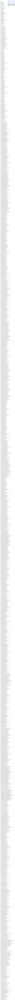

In [42]:
X.plot()

# 3.Ridge Regression

In [43]:
from sklearn.linear_model import Ridge

In [44]:
clfRidge = Ridge(alpha=0.01)
clfRidge.fit(X_train, y_train)
y_pred_rid_reg=clfRidge.predict(X_test)

In [45]:
acc_rid_reg = round( clfRidge.score(X_train, y_train) * 100, 2)
print ('Accuracy of logistic regression classifier on life expectancy: ', str(acc_rid_reg) + ' %')

Accuracy of logistic regression classifier on life expectancy:  94.65 %


# Cross validation for Ridge Regression

In [46]:
features = X_train.columns

In [47]:
cvRidge = cross_val_score(clfRidge , df[features] , df["Life_expectancy_raw_value"] , cv = 5)
cvRidge

array([0.93600634, 0.90685251, 0.94209534, 0.91940169, 0.89848003])

In [48]:
cvRidge = round(cvRidge.mean(), 2)
cvRidge

0.92

# Peason Corr for Ridge

In [49]:
predRidge = clfRidge.predict(X_test)
accuracyRidge = y_test.to_list()

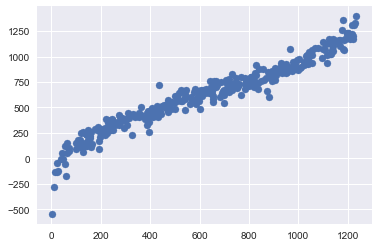

In [50]:
plt.scatter(accuracyRidge ,predRidge)

# 4. Lasso Regression

In [52]:
from sklearn.linear_model import Lasso

In [53]:
clfLasso = Lasso(alpha=0.01)
clfLasso.fit(X_train, y_train) 
y_pred_lasso= clfLasso.predict(X_test)

In [54]:
acc_lasso_reg = round( clfLasso.score(X_train, y_train) * 100, 2)
print ('Accuracy of lasso classifier on life expectancy: ', str(acc_lasso_reg) + ' %')

Accuracy of lasso classifier on life expectancy:  94.7 %


# Cross Validation for Lasso

In [55]:
featurs = X_train.columns

In [56]:
cvLasso = cross_val_score(clfLasso , df[features], df['Life_expectancy_raw_value'] , cv = 5)
cvLasso = round(cvLasso.mean(),2)

In [57]:
cvLasso

0.92

# Comparing Models

In [58]:
models = pd.DataFrame({
    'Model': ['Linear Regression', 'Ridge Regression', 
              'Lasso Regression'],
    
    'Score': [acc_lin_reg, acc_rid_reg, 
              acc_lasso_reg],
    'cvscore': [cvLin, cvRidge, cvLasso]
    })
models.sort_values(by='Score', ascending=False)

,Model,Score,cvscore
0,Linear Regression,94.92,0.93
2,Lasso Regression,94.70,0.92
1,Ridge Regression,94.65,0.92


# Using PCA to reduce dimentionality

In [59]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
X_pca = pd.DataFrame(pca.fit_transform(X))

In [60]:
print(X_pca.head(5))

              0             1             2             3             4  \
0 -1.232998e+10 -2.859935e+09  6.299328e+08 -1.349419e+09  2.733504e+08   
1 -3.738370e+09 -5.077743e+09  9.503179e+08 -1.175612e+09 -2.622877e+07   
2 -1.448458e+10 -2.299637e+09  5.085628e+08 -1.441693e+09  1.805702e+08   
3 -1.273780e+10 -2.735667e+09  7.645309e+08 -1.320221e+09  1.982129e+08   
4 -1.027172e+10 -3.327214e+09  1.338323e+09 -1.092541e+09 -4.791812e+07   

              5             6             7             8             9  
0  9.526092e+07  6.940329e+07 -1.343837e+08  1.959395e+08 -2.102127e+08  
1  1.251933e+08 -7.476957e+06 -1.102882e+08 -3.986328e+07 -1.523479e+08  
2  6.353033e+06  9.469184e+07 -7.106833e+07  1.673377e+08 -1.820727e+08  
3  4.175124e+08  1.024672e+08 -1.249755e+08  2.587207e+08 -2.886314e+08  
4 -7.746473e+07 -1.002620e+08 -1.344280e+08  1.786143e+07 -6.664238e+07  


# Feature Selection and Model Building

In [61]:
## Use train_test_split in sklearn.cross_validation to split data into train and test sets

from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split
from sklearn.model_selection import cross_val_score

X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.70, random_state=1)

In [62]:
# The total number of features have grown substantially after dummying and adding interaction terms
print(df.shape)
print(X.shape)

(1245, 82)
(1245, 3160)


In [63]:
# Such a large set of features can cause overfitting and also slow computing
# Use feature selection to select the most important features
import sklearn.feature_selection

select = sklearn.feature_selection.SelectKBest(k=20)
selected_features = select.fit(X_train, y_train)
indices_selected = selected_features.get_support(indices=True)
colnames_selected = [X.columns[i] for i in indices_selected]

X_train_selected = X_train[colnames_selected]
X_test_selected = X_test[colnames_selected]

In [64]:
print(colnames_selected)

['%_Asian_raw_value_%_Hispanic_raw_value', '%_Asian_raw_value_%_Non-Hispanic_white_raw_value', '%_Asian_raw_value_%_not_proficient_in_English_raw_value', '%_Asian_raw_value_%_Females_raw_value', '%_Asian_raw_value_%_Rural_raw_value', '%_Native_Hawaiian/Other_Pacific_Islander_raw_value_%_Hispanic_raw_value', '%_Native_Hawaiian/Other_Pacific_Islander_raw_value_%_Non-Hispanic_white_raw_value', '%_Native_Hawaiian/Other_Pacific_Islander_raw_value_%_not_proficient_in_English_raw_value', '%_Native_Hawaiian/Other_Pacific_Islander_raw_value_%_Females_raw_value', '%_Native_Hawaiian/Other_Pacific_Islander_raw_value_%_Rural_raw_value', '%_Hispanic_raw_value_%_Non-Hispanic_white_raw_value', '%_Hispanic_raw_value_%_not_proficient_in_English_raw_value', '%_Hispanic_raw_value_%_Females_raw_value', '%_Hispanic_raw_value_%_Rural_raw_value', '%_Non-Hispanic_white_raw_value_%_not_proficient_in_English_raw_value', '%_Non-Hispanic_white_raw_value_%_Females_raw_value', '%_Non-Hispanic_white_raw_value_%_Rural

In [65]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [66]:
def find_model_perf(X_train, y_train, X_test, y_test):
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_hat = [x[1] for x in model.predict(X_test)]
    r2 = r2_score(y_test, y_hat)
    
    return r2

In [ ]:
# Find performance of model using preprocessed data
r2_processed = find_model_perf(X_train_selected, y_train, X_test_selected, y_test)
print(r2_processed)

In [68]:
model = LinearRegression()

In [69]:
model.fit(X_train_selected, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [70]:
model = LinearRegression().fit(X_train, y_train)

In [71]:
r_sq = model.score(X_train, y_train)
print('coefficient of determination:', r_sq)

coefficient of determination: 0.9999999999999999


In [72]:
print('intercept:', model.intercept_)
print('slope:', model.coef_)

intercept: [4306.3961236]
slope: [[ 1.18738285e-05  1.23856732e-06 -2.82095305e-06 ...  5.60735546e-04
  -1.47329680e-04 -1.21390971e-03]]


# At this point it very clear that our model has clearly learnt too much. Congratultions for the overfitting

# Remember CRIPDM - Lets restart and run different models - 

# Lets restart and go through the process again

# Running Baseline Model

In [73]:
df.head()

,Unnamed: 0,Zip,State_Abb,State,Year,Ranked,Premature_death_raw_value,Poor_or_fair_health_raw_value,Poor_physical_health_days_raw_value,Poor_mental_health_days_raw_value,...,%_65_and_older_raw_value,%_Non-Hispanic_African_American_raw_value,%_American_Indian_and_Alaskan_Native_raw_value,%_Asian_raw_value,%_Native_Hawaiian/Other_Pacific_Islander_raw_value,%_Hispanic_raw_value,%_Non-Hispanic_white_raw_value,%_not_proficient_in_English_raw_value,%_Females_raw_value,%_Rural_raw_value
0,3,1001,0,36,2019.0,1.0,8824.057123,0.184111,4.200578,4.306739,...,0.151196,0.192545,0.004756,0.012792,0.001045,0.028575,0.744739,0.008285,0.513422,0.420022
1,4,1003,0,39,2019.0,1.0,7224.632160,0.180605,4.098748,4.249649,...,0.199470,0.089532,0.007760,0.011565,0.000687,0.045502,0.830474,0.004545,0.514528,0.422791
3,6,1007,0,69,2019.0,1.0,11783.543675,0.199969,4.363377,4.315710,...,0.160226,0.214576,0.004279,0.002206,0.001147,0.026381,0.742986,0.003943,0.464531,0.683526
4,7,1009,0,73,2019.0,1.0,10908.101822,0.210953,4.512753,4.701599,...,0.178426,0.014600,0.006326,0.003017,0.001172,0.095651,0.869443,0.018700,0.506886,0.899515
7,10,1015,0,113,2019.0,1.0,12217.759984,0.195847,4.290448,4.476572,...,0.173123,0.207900,0.005291,0.009910,0.001124,0.037497,0.723110,0.008810,0.519307,0.336968


In [74]:
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score, KFold


In [75]:
cros_val = KFold(n_splits=10, random_state=1, shuffle=True)
scaler = MinMaxScaler()
y = df['Life_expectancy_raw_value']

xset = df.drop(["Zip",'State','State_Abb','Year',"Ranked",'Life_expectancy_raw_value',],axis=1)
xset = xset.select_dtypes(exclude=['object'])
X = scaler.fit_transform(xset)

#X_train, X_test, y_train, y_test = train_test_split(X,y)

linreg = LinearRegression()
baseline = np.mean(cross_val_score(linreg,X,y,scoring='r2',cv=cros_val))
baseline

0.9374647807430059

# <span id="3"></span> Defining a Function to Calculate the Adjusted $R^{2}$
#### [Return Contents](#0)
<hr/>

The R-squared increases when the number of features increase. Because of this, sometimes a more robust evaluator is preferred to compare the performance between different models. This evaluater is called adjusted R-squared and it only increases, if the addition of the variable reduces the MSE. The definition of the adjusted  𝑅2  is:


$\bar{R^{2}}=R^{2}-\frac{k-1}{n-k}(1-R^{2})$

where  𝑛  is the number of observations and  𝑘  is the number of parameters.

## Simple Linear Regression

When we model a linear relationship between a response and just one explanatory variable, this is called simple linear regression. I want to predict Life Expectancy and then, our response variable is Life Expectancy. However, for a simple model we also need to select a feature. When I look at the columns of the dataset, Food Insecure seemed the one of the most important feature. When we examine the correlation matrix, we may observe that life expectancy has the highest correlation coefficient with Food insecurity , physical distress etc and this also supports my opinion. Thus, I decided to use living area (sqft) as feature but if you want to examine the relationship between price and another feature, you may prefer that feature.

In [76]:
def adjustedR2(r2,n,k):
    return r2-(k-1)/(n-k)*(1-r2)

In [77]:
import numpy as np
import pandas as pd 
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import folium
from folium.plugins import HeatMap
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

evaluation = pd.DataFrame({'Model': [],
                           'Details':[],
                           'Root Mean Squared Error (RMSE)':[],
                           'R-squared (training)':[],
                           'Adjusted R-squared (training)':[],
                           'R-squared (test)':[],
                           'Adjusted R-squared (test)':[],
                           '5-Fold Cross Validation':[]})


In [78]:
from sklearn import metrics

In [79]:
from sklearn import linear_model

In [80]:
#%%capture
train_data,test_data = train_test_split(df,train_size = 0.8,random_state=3)

lr = linear_model.LinearRegression()
X_train = np.array(train_data['Median_household_income_raw_value'], dtype=pd.Series).reshape(-1,1)
y_train = np.array(train_data['Life_expectancy_raw_value'], dtype=pd.Series)
lr.fit(X_train,y_train)

X_test = np.array(test_data['Median_household_income_raw_value'], dtype=pd.Series).reshape(-1,1)
y_test = np.array(test_data['Life_expectancy_raw_value'], dtype=pd.Series)

pred = lr.predict(X_test)
rmsesm = float(format(np.sqrt(metrics.mean_squared_error(y_test,pred)),'.3f'))
rtrsm = float(format(lr.score(X_train, y_train),'.3f'))
rtesm = float(format(lr.score(X_test, y_test),'.3f'))
cv = float(format(cross_val_score(lr,df[['Median_household_income_raw_value']],df['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

print ("Average Life Expectancy for Test Data: {:.3f}".format(y_test.mean()))
print('Intercept: {}'.format(lr.intercept_))
print('Coefficient: {}'.format(lr.coef_))

r = evaluation.shape[0]
evaluation.loc[r] = ['Simple Linear Regression','-',rmsesm,rtrsm,'-',rtesm,'-',cv]
evaluation

Average Life Expectancy for Test Data: 627.217
Intercept: -324.5249937348781
Coefficient: [0.01696514]


,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462


## <span id="5"></span> Let's Show the Result

Since we have just two dimensions at the simple regression, it is easy to draw it. The below chart determines the result of the simple regression. It does not look like a perfect fit but when we work with real world datasets, having a perfect fit is not easy.

In [81]:
sns.set(style="white", font_scale=1)

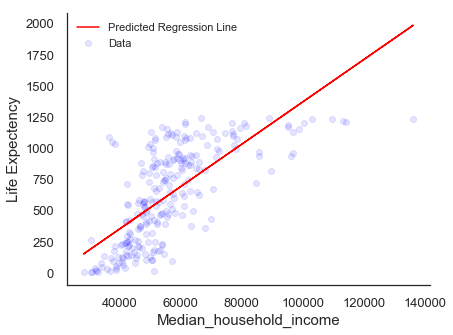

In [82]:
plt.figure(figsize=(6.5,5))
plt.scatter(X_test,y_test,color='blue',label="Data", alpha=.1)
plt.plot(X_test,lr.predict(X_test),color="red",label="Predicted Regression Line")
plt.xlabel("Median_household_income", fontsize=15)
plt.ylabel("Life Expectency", fontsize=15)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.legend()

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

In [ ]:
features = ['Premature_death_raw_value',
 'Poor_or_fair_health_raw_value',
 'Poor_physical_health_days_raw_value',
 'Poor_mental_health_days_raw_value',
 'Low_birthweight_raw_value',
 'Adult_smoking_raw_value',
 'Adult_obesity_raw_value',
 'Food_environment_index_raw_value',
 'Physical_inactivity_raw_value',
 'Access_to_exercise_opportunities_raw_value',
 'Excessive_drinking_raw_value',
 'Alcohol-impaired_driving_deaths_raw_value',
 'Sexually_transmitted_infections_raw_value',
 'Teen_births_raw_value',
 'Uninsured_raw_value',
 'Primary_care_physicians_raw_value',
 'Ratio_of_population_to_primary_care_physicians.',
 'Dentists_raw_value',
 'Ratio_of_population_to_dentists.',
 'Mental_health_providers_raw_value',
 'Ratio_of_population_to_mental_health_providers.',
 'Preventable_hospital_stays_raw_value',
 'Mammography_screening_raw_value',
 'Flu_vaccinations_raw_value',
 'High_school_graduation_raw_value',
 'Some_college_raw_value',
 'Unemployment_raw_value',
 'Children_in_poverty_raw_value',
 'Income_inequality_raw_value',
 'Children_in_single-parent_households_raw_value',
 'Social_associations_raw_value',
 'Violent_crime_raw_value',
 'Injury_deaths_raw_value',
 'Air_pollution_-_particulate_matter_raw_value',
 'Drinking_water_violations_raw_value',
 'Severe_housing_problems_raw_value',
 'Percentage_of_households_with_high_housing_costs',
 'Percentage_of_households_with_overcrowding',
 'Percentage_of_households_with_lack_of_kitchen_or_plumbing_facilities',
 'Driving_alone_to_work_raw_value',
 'Long_commute_-_driving_alone_raw_value',
 'Life_expectancy_raw_value',
 'Premature_age-adjusted_mortality_raw_value',
 'Child_mortality_raw_value',
 'Frequent_physical_distress_raw_value',
 'Frequent_mental_distress_raw_value',
 'Diabetes_prevalence_raw_value',
 'HIV_prevalence_raw_value',
 'Food_insecurity_raw_value',
 'Limited_access_to_healthy_foods_raw_value',
 'Drug_overdose_deaths_raw_value',
 'Motor_vehicle_crash_deaths_raw_value',
 'Insufficient_sleep_raw_value',
 'Uninsured_adults_raw_value',
 'Uninsured_children_raw_value',
 'Other_primary_care_providers_raw_value',
 'Ratio_of_population_to_primary_care_providers_other_than_physicians.',
 'Median_household_income_raw_value',
 'Children_eligible_for_free_or_reduced_price_lunch_raw_value',
 'Residential_segregation_-_Black/White_raw_value',
 'Residential_segregation_-_non-white/white_raw_value',
 'Firearm_fatalities_raw_value',
 'Homeownership_raw_value',
 'Severe_housing_cost_burden_raw_value',
 'Population_raw_value',
 '%_below_18_years_of_age_raw_value',
 '%_65_and_older_raw_value',
 '%_Non-Hispanic_African_American_raw_value',
 '%_American_Indian_and_Alaskan_Native_raw_value',
 '%_Asian_raw_value',
 '%_Native_Hawaiian/Other_Pacific_Islander_raw_value',
 '%_Hispanic_raw_value',
 '%_Non-Hispanic_white_raw_value',
 '%_not_proficient_in_English_raw_value',
 '%_Females_raw_value',
 '%_Rural_raw_value']

mask = np.zeros_like(df[features].corr(), dtype=np.bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))
plt.title('Pearson Correlation Matrix',fontsize=25)

sns.heatmap(df[features].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse 
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

In [ ]:
#copy df into another dataframe just in case

In [83]:
df_dm=df.copy()
df_dm.describe()

,Unnamed: 0,Zip,State_Abb,State,Year,Ranked,Premature_death_raw_value,Poor_or_fair_health_raw_value,Poor_physical_health_days_raw_value,Poor_mental_health_days_raw_value,...,%_65_and_older_raw_value,%_Non-Hispanic_African_American_raw_value,%_American_Indian_and_Alaskan_Native_raw_value,%_Asian_raw_value,%_Native_Hawaiian/Other_Pacific_Islander_raw_value,%_Hispanic_raw_value,%_Non-Hispanic_white_raw_value,%_not_proficient_in_English_raw_value,%_Females_raw_value,%_Rural_raw_value
count,1245.000000,1245.000000,1245.000000,1245.000000,1245.0,1245.0,1245.000000,1245.000000,1245.000000,1245.000000,...,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000
mean,1578.311647,30028.159839,21.205622,444.548594,2019.0,1.0,8052.920877,0.170825,3.905012,3.988795,...,0.169760,0.101393,0.015858,0.024003,0.001369,0.105684,0.737335,0.021124,0.504389,0.373090
std,924.263237,15184.818941,12.579374,252.366842,0.0,0.0,2247.510868,0.040484,0.605599,0.509725,...,0.039974,0.124771,0.046911,0.034506,0.002034,0.131680,0.185291,0.028137,0.014687,0.244730
min,3.000000,1001.000000,0.000000,0.000000,2019.0,1.0,2900.417484,0.082892,2.323511,2.474197,...,0.075450,0.002790,0.001036,0.001192,0.000041,0.006673,0.035084,0.000000,0.375092,0.000000
25%,731.000000,18035.000000,10.000000,235.000000,2019.0,1.0,6467.526692,0.142096,3.500632,3.641614,...,0.143829,0.017369,0.003563,0.007035,0.000450,0.029806,0.634443,0.005239,0.500154,0.165964
50%,1682.000000,30111.000000,21.000000,439.000000,2019.0,1.0,7825.374592,0.165401,3.873719,3.989233,...,0.167608,0.051550,0.005659,0.012673,0.000777,0.057742,0.785820,0.011341,0.506371,0.349909
75%,2290.000000,42011.000000,33.000000,653.000000,2019.0,1.0,9478.696165,0.194813,4.261390,4.297367,...,0.190140,0.131216,0.011023,0.027316,0.001389,0.124229,0.886216,0.023628,0.512407,0.560780
max,3190.000000,56037.000000,43.000000,895.000000,2019.0,1.0,18571.489514,0.359188,6.396212,5.964156,...,0.569440,0.722093,0.791522,0.375495,0.029067,0.955221,0.971570,0.219558,0.541143,1.000000


## <span id="12"></span> Multiple Regression - 1

Multiple Linear Regression 1
We determined features at first sight by looking at the previous sections and used in my first multiple linear regression. As in the simple regression, I printed the coefficients which the model uses for the predictions. However, this time we must use the below definition for our predictions, if we want to make calculations manually

In [84]:
train_data_dm,test_data_dm = train_test_split(df_dm,train_size = 0.8,random_state=3)

features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value" ]
complex_model_1 = linear_model.LinearRegression()
complex_model_1.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

print('Intercept: {}'.format(complex_model_1.intercept_))
print('Coefficients: {}'.format(complex_model_1.coef_))

pred = complex_model_1.predict(test_data_dm[features])
rmsecm = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred)),'.3f'))
rtrcm = float(format(complex_model_1.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm = float(format(adjustedR2(complex_model_1.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm = float(format(complex_model_1.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm = float(format(adjustedR2(complex_model_1.score(test_data_dm[features],test_data['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv = float(format(cross_val_score(complex_model_1,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation.shape[0]
evaluation.loc[r] = ['Multiple Regression-1','selected features',rmsecm,rtrcm,artrcm,rtecm,artecm,cv]
evaluation.sort_values(by = '5-Fold Cross Validation', ascending=False)

Intercept: -1319.7210205003041
Coefficients: [5.85512978e-03 5.42983569e+02 2.56653835e+03 7.64315401e+01
 2.66025053e+02 1.34095503e+03 2.33935707e+04]


,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
1,Multiple Regression-1,selected features,231.818,0.647,0.645,0.620,0.61,0.606
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462


## <span id="12"></span> Multiple Regression - 2

In addition to the previous subsection, I added more features to the ***features*** list. Also, I printed the coefficients of the model as in the previous subsection. When we look at the evaluation metrics, they improved significantly.

In [86]:
train_data_dm,test_data_dm = train_test_split(df_dm,train_size = 0.8,random_state=3)

features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value"]
complex_model_2 = linear_model.LinearRegression()
complex_model_2.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

print('Intercept: {}'.format(complex_model_1.intercept_))
print('Coefficients: {}'.format(complex_model_1.coef_))

pred = complex_model_2.predict(test_data_dm[features])
rmsecm = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred)),'.3f'))
rtrcm = float(format(complex_model_2.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm = float(format(adjustedR2(complex_model_2.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm = float(format(complex_model_2.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm = float(format(adjustedR2(complex_model_2.score(test_data_dm[features],test_data['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv = float(format(cross_val_score(complex_model_2,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation.shape[0]
evaluation.loc[r] = ['Multiple Regression-2','selected features',rmsecm,rtrcm,artrcm,rtecm,artecm,cv]
evaluation.sort_values(by = '5-Fold Cross Validation', ascending=False)

Intercept: -1319.7210205003041
Coefficients: [5.85512978e-03 5.42983569e+02 2.56653835e+03 7.64315401e+01
 2.66025053e+02 1.34095503e+03 2.33935707e+04]


,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
2,Multiple Regression-2,selected features,228.924,0.662,0.659,0.629,0.615,0.621
1,Multiple Regression-1,selected features,231.818,0.647,0.645,0.620,0.61,0.606
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462


## <span id="13"></span> Multiple Regression - 3

In order to observe differences easily, I created a model with all features without any preprossing. Evaluation metrics improved remarkable again.  

In [87]:
train_data_dm,test_data_dm = train_test_split(df_dm,train_size = 0.8,random_state=3)

features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value",
           '%_not_proficient_in_English_raw_value']
complex_model_3 = linear_model.LinearRegression()
complex_model_3.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

print('Intercept: {}'.format(complex_model_3.intercept_))
print('Coefficients: {}'.format(complex_model_3.coef_))

pred = complex_model_3.predict(test_data_dm[features])
rmsecm = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred)),'.3f'))
rtrcm = float(format(complex_model_3.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm = float(format(adjustedR2(complex_model_3.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm = float(format(complex_model_3.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm = float(format(adjustedR2(complex_model_3.score(test_data_dm[features],test_data['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv = float(format(cross_val_score(complex_model_3,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation.shape[0]
evaluation.loc[r] = ['Multiple Regression-3','selected features',rmsecm,rtrcm,artrcm,rtecm,artecm,cv]
evaluation.sort_values(by = '5-Fold Cross Validation', ascending=False)

Intercept: -1707.3222097919258
Coefficients: [ 6.34714359e-03  1.02752201e+03  2.12121255e+03  5.39048376e+01
  7.79464690e+01 -2.29164712e+02 -1.92598911e+04  1.25781752e+03
 -1.88039760e+02 -2.58576274e+04  4.73374139e+03]


,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
3,Multiple Regression-3,selected features,201.562,0.751,0.749,0.713,0.701,0.715
2,Multiple Regression-2,selected features,228.924,0.662,0.659,0.629,0.615,0.621
1,Multiple Regression-1,selected features,231.818,0.647,0.645,0.620,0.61,0.606
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462


## <span id="14"></span> Multiple Regression - 4

In [88]:
train_data_dm,test_data_dm = train_test_split(df_dm,train_size = 0.8,random_state=3)

features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value",
           '%_not_proficient_in_English_raw_value',"Percentage_of_households_with_high_housing_costs"]
complex_model_4 = linear_model.LinearRegression()
complex_model_4.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

print('Intercept: {}'.format(complex_model_4.intercept_))
print('Coefficients: {}'.format(complex_model_4.coef_))

pred = complex_model_4.predict(test_data_dm[features])
rmsecm = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred)),'.3f'))
rtrcm = float(format(complex_model_4.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm = float(format(adjustedR2(complex_model_4.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm = float(format(complex_model_4.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm = float(format(adjustedR2(complex_model_4.score(test_data_dm[features],test_data['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv = float(format(cross_val_score(complex_model_4,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation.shape[0]
evaluation.loc[r] = ['Multiple Regression-4','selected features',rmsecm,rtrcm,artrcm,rtecm,artecm,cv]
evaluation.sort_values(by = '5-Fold Cross Validation', ascending=False)

Intercept: -1821.9501091941527
Coefficients: [ 6.90517145e-03  9.78615305e+02  2.09800438e+03  6.15977229e+01
  4.34614244e+01 -4.70424496e+02 -3.21028255e+04  1.21111803e+03
 -1.62658491e+02 -2.45458658e+04  4.44164318e+03  8.50358022e+02]


,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
4,Multiple Regression-4,selected features,199.516,0.755,0.752,0.718,0.705,0.719
3,Multiple Regression-3,selected features,201.562,0.751,0.749,0.713,0.701,0.715
2,Multiple Regression-2,selected features,228.924,0.662,0.659,0.629,0.615,0.621
1,Multiple Regression-1,selected features,231.818,0.647,0.645,0.620,0.61,0.606
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462


# <span id="15"></span> Regularization
#### [Return Contents](#0)
<hr/>

Regularization is designed to address the problem of overfitting and undefitting. Overfitting means high variance and is usually caused by a complicated function that creates a lot of unnecessary curves and angles unrelated to the data. This function fits training data well but might cause poor results for the test set. On the other hand, underfitting means low variance and a very simple model. This might also cause poor results too. Possible remedies are adjusting features manually or using some model selection algoritms which brings an extra workload. Conversely, when we apply regularization, all the features are kept and the model adjusts  𝜃𝑗 . This especially works when we have a lot of slightly useful features. There are two widely used regularization types (Ridge and Lasso Regressions) and in this section, I used them.

When to use ridge vs lasso regression:

Many small/medium sized effects: use ridge.

Only a few variables with medium/large effect: use lasso.

## <span id="16"></span> Ridge Regression

Ridge regression is called **L2 regularization** and by adding a penalty, we obtain the below equation

$$RSS_{RIDGE} = \sum_{i=1}^{m}(h_{\theta}(x_{i})-y_{i})^{2} + \alpha \sum_{j=1}^{n}\theta^{2}_{j}$$

By changing the $\alpha$ value, we can control the amount of the regularization. When we increase $\alpha$, regularization increases and the opposite is valid too. As a result of this, I selected different $\alpha$ values and used a linear regression without regularization in order to observe the differences easily.

In [89]:
features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value",
           '%_not_proficient_in_English_raw_value',"Percentage_of_households_with_high_housing_costs"]

complex_model_R = linear_model.Ridge(alpha=1)
complex_model_R.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

pred1 = complex_model_R.predict(test_data_dm[features])
rmsecm1 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred1)),'.3f'))
rtrcm1 = float(format(complex_model_R.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm1 = float(format(adjustedR2(complex_model_R.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm1 = float(format(complex_model_R.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm1 = float(format(adjustedR2(complex_model_R.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv1 = float(format(cross_val_score(complex_model_R,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

complex_model_R = linear_model.Ridge(alpha=100)
complex_model_R.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

pred2 = complex_model_R.predict(test_data_dm[features])
rmsecm2 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred2)),'.3f'))
rtrcm2 = float(format(complex_model_R.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm2 = float(format(adjustedR2(complex_model_R.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm2 = float(format(complex_model_R.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm2 = float(format(adjustedR2(complex_model_R.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv2 = float(format(cross_val_score(complex_model_R,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

complex_model_R = linear_model.Ridge(alpha=1000)
complex_model_R.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

pred3 = complex_model_R.predict(test_data_dm[features])
rmsecm3 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred3)),'.3f'))
rtrcm3 = float(format(complex_model_R.score(train_data_dm[features],train_data_dm["Life_expectancy_raw_value"]),'.3f'))
artrcm3 = float(format(adjustedR2(complex_model_R.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm3 = float(format(complex_model_R.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm3 = float(format(adjustedR2(complex_model_R.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv3 = float(format(cross_val_score(complex_model_R,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation.shape[0]
evaluation.loc[r] = ['Ridge Regression','alpha=1, all features',rmsecm1,rtrcm1,artrcm1,rtecm1,artecm1,cv1]
evaluation.loc[r+1] = ['Ridge Regression','alpha=100, all features',rmsecm2,rtrcm2,artrcm2,rtecm2,artecm2,cv2]
evaluation.loc[r+2] = ['Ridge Regression','alpha=1000, all features',rmsecm3,rtrcm3,artrcm3,rtecm3,artecm3,cv3]
evaluation.sort_values(by = '5-Fold Cross Validation', ascending=False)

,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
4,Multiple Regression-4,selected features,199.516,0.755,0.752,0.718,0.705,0.719
3,Multiple Regression-3,selected features,201.562,0.751,0.749,0.713,0.701,0.715
5,Ridge Regression,"alpha=1, all features",213.236,0.708,0.705,0.678,0.663,0.671
2,Multiple Regression-2,selected features,228.924,0.662,0.659,0.629,0.615,0.621
1,Multiple Regression-1,selected features,231.818,0.647,0.645,0.620,0.61,0.606
6,Ridge Regression,"alpha=100, all features",255.932,0.550,0.545,0.537,0.515,0.512
7,Ridge Regression,"alpha=1000, all features",266.678,0.515,0.509,0.497,0.474,0.476
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462


## <span id="17"></span> Lasso Regression

Lasso regression is called **L1 regularization** and it is defined as

$$RSS_{LASSO} = \sum_{i=1}^{m}(h_{\theta}(x_{i})-y_{i})^{2} + \alpha \sum_{j=1}^{n}|\theta_{j}|$$

The main difference between ridge and lasso is the penalty but $\alpha$ works the same way.   

In [90]:
features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value",
           '%_not_proficient_in_English_raw_value',"Percentage_of_households_with_high_housing_costs"]

complex_model_L = linear_model.Lasso(alpha=1)
complex_model_L.fit(train_data_dm[features],train_data_dm["Life_expectancy_raw_value"])

pred1 = complex_model_L.predict(test_data_dm[features])
rmsecm1 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred1)),'.3f'))
rtrcm1 = float(format(complex_model_L.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm1 = float(format(adjustedR2(complex_model_L.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm1 = float(format(complex_model_L.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm1 = float(format(adjustedR2(complex_model_L.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv1 = float(format(cross_val_score(complex_model_L,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

complex_model_L = linear_model.Lasso(alpha=100)
complex_model_L.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

pred2 = complex_model_L.predict(test_data_dm[features])
rmsecm2 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred2)),'.3f'))
rtrcm2 = float(format(complex_model_L.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm2 = float(format(adjustedR2(complex_model_L.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm2 = float(format(complex_model_L.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm2 = float(format(adjustedR2(complex_model_L.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv2 = float(format(cross_val_score(complex_model_L,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

complex_model_L = linear_model.Lasso(alpha=1000)
complex_model_L.fit(train_data_dm[features],train_data_dm['Life_expectancy_raw_value'])

pred3 = complex_model_L.predict(test_data_dm[features])
rmsecm3 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred3)),'.3f'))
rtrcm3 = float(format(complex_model_L.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),'.3f'))
artrcm3 = float(format(adjustedR2(complex_model_L.score(train_data_dm[features],train_data_dm['Life_expectancy_raw_value']),train_data_dm.shape[0],len(features)),'.3f'))
rtecm3 = float(format(complex_model_L.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),'.3f'))
artecm3 = float(format(adjustedR2(complex_model_L.score(test_data_dm[features],test_data_dm['Life_expectancy_raw_value']),test_data_dm.shape[0],len(features)),'.3f'))
cv3 = float(format(cross_val_score(complex_model_L,df_dm[features],df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation.shape[0]
evaluation.loc[r] = ['Lasso Regression','alpha=1, all features',rmsecm1,rtrcm1,artrcm1,rtecm1,artecm1,cv1]
evaluation.loc[r+1] = ['Lasso Regression','alpha=100, all features',rmsecm2,rtrcm2,artrcm2,rtecm2,artecm2,cv2]
evaluation.loc[r+2] = ['Lasso Regression','alpha=1000, all features',rmsecm3,rtrcm3,artrcm3,rtecm3,artecm3,cv3]
evaluation.sort_values(by = '5-Fold Cross Validation', ascending=False)

,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
4,Multiple Regression-4,selected features,199.516,0.755,0.752,0.718,0.705,0.719
3,Multiple Regression-3,selected features,201.562,0.751,0.749,0.713,0.701,0.715
8,Lasso Regression,"alpha=1, all features",210.042,0.722,0.719,0.688,0.673,0.681
5,Ridge Regression,"alpha=1, all features",213.236,0.708,0.705,0.678,0.663,0.671
2,Multiple Regression-2,selected features,228.924,0.662,0.659,0.629,0.615,0.621
1,Multiple Regression-1,selected features,231.818,0.647,0.645,0.620,0.61,0.606
6,Ridge Regression,"alpha=100, all features",255.932,0.550,0.545,0.537,0.515,0.512
7,Ridge Regression,"alpha=1000, all features",266.678,0.515,0.509,0.497,0.474,0.476
0,Simple Linear Regression,-,271.345,0.501,-,0.479,-,0.462
9,Lasso Regression,"alpha=100, all features",271.344,0.501,0.496,0.479,0.455,0.462


# <span id="18"></span> Polynomial Regression
#### [Return Contents](#0)
<hr/>

For the linear models, the main idea is to fit a straight line to our data. However, if the data has a quadratic distribution, this time choosing a quadratic function and applying a polynomial transformation may give us better results. This time the hypothesis function is defined as

$$h_{\theta}(X)=\theta_{0}+\theta_{1}x+\theta_{2}x^{2}+...+\theta_{n}x^{n}$$

Since there are many variations for the polynomial regression, I prefered to show results by a new table and it can be seen from the below table that polynomial transformation improved the model fit a lot. On the other hand, while using polynomial transformation and deciding to degree, we should be very careful because it **migh cause overfitting**. Also, in the below table overfitting exists for some models. The 5-fold cross validation metrics are negative or low for these models although they have very high R-squared values for the training set.

In [91]:
evaluation_poly = pd.DataFrame({'Model': [],
                                'Details':[],
                                'Root Mean Squared Error (RMSE)':[],
                                'R-squared (training)':[],
                                'Adjusted R-squared (training)':[],
                                'R-squared (test)':[],
                                'Adjusted R-squared (test)':[],
                                '5-Fold Cross Validation':[]})

features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" ,
            "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,
            "Dentists_raw_value" ]
polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df[features])
X_trainpoly = polyfeat.fit_transform(train_data[features])
X_testpoly = polyfeat.fit_transform(test_data[features])
poly = linear_model.LinearRegression().fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred1 = poly.predict(X_testpoly)
rmsepoly1 = float(format(np.sqrt(metrics.mean_squared_error(test_data['Life_expectancy_raw_value'],pred1)),'.3f'))
rtrpoly1 = float(format(poly.score(X_trainpoly,train_data['Life_expectancy_raw_value']),'.3f'))
rtepoly1 = float(format(poly.score(X_testpoly,test_data['Life_expectancy_raw_value']),'.3f'))
cv1 = float(format(cross_val_score(linear_model.LinearRegression(),X_allpoly,df['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

polyfeat = PolynomialFeatures(degree=3)
X_allpoly = polyfeat.fit_transform(df[features])
X_trainpoly = polyfeat.fit_transform(train_data[features])
X_testpoly = polyfeat.fit_transform(test_data[features])
poly = linear_model.LinearRegression().fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred2 = poly.predict(X_testpoly)
rmsepoly2 = float(format(np.sqrt(metrics.mean_squared_error(test_data['Life_expectancy_raw_value'],pred2)),'.3f'))
rtrpoly2 = float(format(poly.score(X_trainpoly,train_data['Life_expectancy_raw_value']),'.3f'))
rtepoly2 = float(format(poly.score(X_testpoly,test_data['Life_expectancy_raw_value']),'.3f'))
cv2 = float(format(cross_val_score(linear_model.LinearRegression(),X_allpoly,df['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value",
           '%_not_proficient_in_English_raw_value']
polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df[features])
X_trainpoly = polyfeat.fit_transform(train_data[features])
X_testpoly = polyfeat.fit_transform(test_data[features])
poly = linear_model.LinearRegression().fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred3 = poly.predict(X_testpoly)
rmsepoly3 = float(format(np.sqrt(metrics.mean_squared_error(test_data['Life_expectancy_raw_value'],pred3)),'.3f'))
rtrpoly3 = float(format(poly.score(X_trainpoly,train_data['Life_expectancy_raw_value']),'.3f'))
rtepoly3 = float(format(poly.score(X_testpoly,test_data['Life_expectancy_raw_value']),'.3f'))
cv3 = float(format(cross_val_score(linear_model.LinearRegression(),X_allpoly,df['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

polyfeat = PolynomialFeatures(degree=3)
X_allpoly = polyfeat.fit_transform(df[features])
X_trainpoly = polyfeat.fit_transform(train_data[features])
X_testpoly = polyfeat.fit_transform(test_data[features])
poly = linear_model.LinearRegression().fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred4 = poly.predict(X_testpoly)
rmsepoly4 = float(format(np.sqrt(metrics.mean_squared_error(test_data['Life_expectancy_raw_value'],pred4)),'.3f'))
rtrpoly4 = float(format(poly.score(X_trainpoly,train_data['Life_expectancy_raw_value']),'.3f'))
rtepoly4 = float(format(poly.score(X_testpoly,test_data['Life_expectancy_raw_value']),'.3f'))
cv4 = float(format(cross_val_score(linear_model.LinearRegression(),X_allpoly,df['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))


features = ['Median_household_income_raw_value','Some_college_raw_value' , "Excessive_drinking_raw_value" , "Food_environment_index_raw_value" , "Access_to_exercise_opportunities_raw_value" , "%_Asian_raw_value" ,"Dentists_raw_value"
           ,'Mammography_screening_raw_value',"Flu_vaccinations_raw_value","Primary_care_physicians_raw_value",
           '%_not_proficient_in_English_raw_value',"Percentage_of_households_with_high_housing_costs"]
polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df_dm[features])
X_trainpoly = polyfeat.fit_transform(train_data_dm[features])
X_testpoly = polyfeat.fit_transform(test_data_dm[features])
poly = linear_model.LinearRegression().fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred5 = poly.predict(X_testpoly)
rmsepoly5 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred5)),'.3f'))
rtrpoly5 = float(format(poly.score(X_trainpoly,train_data_dm['Life_expectancy_raw_value']),'.3f'))
rtepoly5 = float(format(poly.score(X_testpoly,test_data_dm['Life_expectancy_raw_value']),'.3f'))
cv5 = float(format(cross_val_score(linear_model.LinearRegression(),X_allpoly,df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df_dm[features])
X_trainpoly = polyfeat.fit_transform(train_data_dm[features])
X_testpoly = polyfeat.fit_transform(test_data_dm[features])
poly = linear_model.Ridge(alpha=1).fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred6 = poly.predict(X_testpoly)
rmsepoly6 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred6)),'.3f'))
rtrpoly6 = float(format(poly.score(X_trainpoly,train_data_dm['Life_expectancy_raw_value']),'.3f'))
rtepoly6 = float(format(poly.score(X_testpoly,test_data_dm['Life_expectancy_raw_value']),'.3f'))
cv6 = float(format(cross_val_score(linear_model.Ridge(alpha=1),X_allpoly,df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df_dm[features])
X_trainpoly = polyfeat.fit_transform(train_data_dm[features])
X_testpoly = polyfeat.fit_transform(test_data_dm[features])
poly = linear_model.Ridge(alpha=50000).fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred7 = poly.predict(X_testpoly)
rmsepoly7 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred7)),'.3f'))
rtrpoly7 = float(format(poly.score(X_trainpoly,train_data_dm['Life_expectancy_raw_value']),'.3f'))
rtepoly7 = float(format(poly.score(X_testpoly,test_data_dm['Life_expectancy_raw_value']),'.3f'))
cv7 = float(format(cross_val_score(linear_model.Ridge(alpha=50000),X_allpoly,df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df_dm[features])
X_trainpoly = polyfeat.fit_transform(train_data_dm[features])
X_testpoly = polyfeat.fit_transform(test_data_dm[features])
poly = linear_model.Lasso(alpha=1).fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred8 = poly.predict(X_testpoly)
rmsepoly8 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred8)),'.3f'))
rtrpoly8 = float(format(poly.score(X_trainpoly,train_data_dm['Life_expectancy_raw_value']),'.3f'))
rtepoly8 = float(format(poly.score(X_testpoly,test_data_dm['Life_expectancy_raw_value']),'.3f'))
cv8 = float(format(cross_val_score(linear_model.Lasso(alpha=1),X_allpoly,df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

polyfeat = PolynomialFeatures(degree=2)
X_allpoly = polyfeat.fit_transform(df_dm[features])
X_trainpoly = polyfeat.fit_transform(train_data_dm[features])
X_testpoly = polyfeat.fit_transform(test_data_dm[features])
poly = linear_model.Lasso(alpha=50000).fit(X_trainpoly, train_data['Life_expectancy_raw_value'])

pred9 = poly.predict(X_testpoly)
rmsepoly9 = float(format(np.sqrt(metrics.mean_squared_error(test_data_dm['Life_expectancy_raw_value'],pred9)),'.3f'))
rtrpoly9 = float(format(poly.score(X_trainpoly,train_data_dm['Life_expectancy_raw_value']),'.3f'))
rtepoly9 = float(format(poly.score(X_testpoly,test_data_dm['Life_expectancy_raw_value']),'.3f'))
cv9 = float(format(cross_val_score(linear_model.Lasso(alpha=50000),X_allpoly,df_dm['Life_expectancy_raw_value'],cv=5).mean(),'.3f'))

r = evaluation_poly.shape[0]
evaluation_poly.loc[r] = ['Polynomial Regression','degree=2, selected features, no preprocessing',rmsepoly1,rtrpoly1,'-',rtepoly1,'-',cv1]
evaluation_poly.loc[r+1] = ['Polynomial Regression','degree=3, selected features, no preprocessing',rmsepoly2,rtrpoly2,'-',rtepoly2,'-',cv2]
evaluation_poly.loc[r+2] = ['Polynomial Regression','degree=2, all features, no preprocessing',rmsepoly3,rtrpoly3,'-',rtepoly3,'-',cv3]
evaluation_poly.loc[r+3] = ['Polynomial Regression','degree=3, all features, no preprocessing',rmsepoly4,rtrpoly4,'-',rtepoly4,'-',cv4]
evaluation_poly.loc[r+4] = ['Polynomial Regression','degree=2, all features',rmsepoly5,rtrpoly5,'-',rtepoly5,'-',cv5]
evaluation_poly.loc[r+5] = ['Polynomial Ridge Regression','alpha=1, degree=2, all features',rmsepoly6,rtrpoly6,'-',rtepoly6,'-',cv6]
evaluation_poly.loc[r+6] = ['Polynomial Ridge Regression','alpha=50000, degree=2, all features',rmsepoly7,rtrpoly7,'-',rtepoly7,'-',cv7]
evaluation_poly.loc[r+7] = ['Polynomial Lasso Regression','alpha=1, degree=2, all features',rmsepoly8,rtrpoly8,'-',rtepoly8,'-',cv8]
evaluation_poly.loc[r+8] = ['Polynomial Lasso Regression','alpha=50000, degree=2, all features',rmsepoly9,rtrpoly9,'-',rtepoly9,'-',cv9]
evaluation_poly_temp = evaluation_poly[['Model','Details','Root Mean Squared Error (RMSE)','R-squared (training)','R-squared (test)','5-Fold Cross Validation']]
evaluation_poly_temp.sort_values(by = '5-Fold Cross Validation', ascending=False)

,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),R-squared (test),5-Fold Cross Validation
5,Polynomial Ridge Regression,"alpha=1, degree=2, all features",196.659,0.767,0.726,0.722
2,Polynomial Regression,"degree=2, all features, no preprocessing",199.727,0.787,0.718,0.720
4,Polynomial Regression,"degree=2, all features",210.510,0.775,0.687,0.709
7,Polynomial Lasso Regression,"alpha=1, degree=2, all features",206.487,0.753,0.698,0.709
6,Polynomial Ridge Regression,"alpha=50000, degree=2, all features",204.938,0.747,0.703,0.705
3,Polynomial Regression,"degree=3, all features, no preprocessing",285.037,0.703,0.425,0.695
8,Polynomial Lasso Regression,"alpha=50000, degree=2, all features",209.078,0.718,0.691,0.674
0,Polynomial Regression,"degree=2, selected features, no preprocessing",221.250,0.709,0.654,0.651
1,Polynomial Regression,"degree=3, selected features, no preprocessing",226.532,0.699,0.637,0.579


# <span id="20"></span>Comparing  Evaluation Table
#### [Return Contents](#0)
<hr/>

In [92]:
evaluation_temp=evaluation.append(evaluation_poly)
evaluation_temp1=evaluation_temp.sort_values(by = '5-Fold Cross Validation', ascending=False)
evaluation_temp2=evaluation_temp1.reset_index()
evaluation_f=evaluation_temp2.iloc[:,1:]
evaluation_f

,Model,Details,Root Mean Squared Error (RMSE),R-squared (training),Adjusted R-squared (training),R-squared (test),Adjusted R-squared (test),5-Fold Cross Validation
0,Polynomial Ridge Regression,"alpha=1, degree=2, all features",196.659,0.767,-,0.726,-,0.722
1,Polynomial Regression,"degree=2, all features, no preprocessing",199.727,0.787,-,0.718,-,0.720
2,Multiple Regression-4,selected features,199.516,0.755,0.752,0.718,0.705,0.719
3,Multiple Regression-3,selected features,201.562,0.751,0.749,0.713,0.701,0.715
4,Polynomial Regression,"degree=2, all features",210.510,0.775,-,0.687,-,0.709
5,Polynomial Lasso Regression,"alpha=1, degree=2, all features",206.487,0.753,-,0.698,-,0.709
6,Polynomial Ridge Regression,"alpha=50000, degree=2, all features",204.938,0.747,-,0.703,-,0.705
7,Polynomial Regression,"degree=3, all features, no preprocessing",285.037,0.703,-,0.425,-,0.695
8,Lasso Regression,"alpha=1, all features",210.042,0.722,0.719,0.688,0.673,0.681
9,Polynomial Lasso Regression,"alpha=50000, degree=2, all features",209.078,0.718,-,0.691,-,0.674


# Conclusion

When we look at the evaluation table, **2nd degree polynomial (all features, no preprocessing)** is the best. However, I have doubts about its reliability. I would prefer the **polynomial ridge regression (alpha=50000, degree=2, all features)** but other models might be useful depending to the situation too. 

In this project , the finding that stands out the most is that the simplest model is the best model.